In [1]:
import pandas as pd

# Path to your new dataset
file_path = r"C:\Users\jueva\OneDrive\Documents\FYP\dataset.csv"

# Load the dataset
df = pd.read_csv(file_path)

# Print column names
print("Column names:")
print(df.columns)


Column names:
Index(['IND_UUID', 'IND_NAME', 'DIM_GEO_CODE_TYPE', 'DIM_GEO_CODE_M49',
       'GEO_NAME_SHORT', 'DIM_TIME_TYPE', 'DIM_TIME', 'Degree of urbanization',
       'PERCENT_POP_N', 'Sex', 'Age', 'RATE_PER_100000_N',
       'RATE_PER_100000_NL', 'RATE_PER_100000_NU', 'RATE_PER_100_N',
       'RATE_PER_100_NL', 'RATE_PER_100_NU', 'RATE_PER_10000_N',
       'RATE_PER_1000_N', 'RATE_PER_1000_NL', 'RATE_PER_1000_NU', 'COUNT_N',
       'PERCENT_POP_NL', 'PERCENT_POP_NU', 'MONEY_N', 'RATE_PER_CAPITA_N',
       'RATE_PER_CAPITA_NL', 'RATE_PER_CAPITA_NU', 'RATE_N', 'RATE_NL',
       'RATE_NU'],
      dtype='object')


In [2]:
columns_to_drop = [
    'IND_UUID', 'DIM_GEO_CODE_TYPE', 'DIM_TIME_TYPE', 'Degree of urbanization',
    'PERCENT_POP_N', 'Sex', 'Age',
    'RATE_PER_100000_NL', 'RATE_PER_100000_NU',
    'RATE_PER_100_NL', 'RATE_PER_100_NU',
    'RATE_PER_1000_NL', 'RATE_PER_1000_NU',
    'PERCENT_POP_NL', 'PERCENT_POP_NU',
    'RATE_PER_CAPITA_NL', 'RATE_PER_CAPITA_NU',
    'RATE_NL', 'RATE_NU'
]

# Drop the columns (ignore if not found)
df = df.drop(columns=[col for col in columns_to_drop if col in df.columns])

# Print updated column names
print("Remaining columns:")
print(df.columns)

# Optional: save cleaned version
# df.to_csv(r"C:\Users\jueva\OneDrive\Documents\FYP\cleaned_dataset.csv", index=False)


Remaining columns:
Index(['IND_NAME', 'DIM_GEO_CODE_M49', 'GEO_NAME_SHORT', 'DIM_TIME',
       'RATE_PER_100000_N', 'RATE_PER_100_N', 'RATE_PER_10000_N',
       'RATE_PER_1000_N', 'COUNT_N', 'MONEY_N', 'RATE_PER_CAPITA_N', 'RATE_N'],
      dtype='object')


In [3]:
print(df.shape)

(127825, 12)


In [4]:
import pandas as pd

# Load the dataset
file_path = r"C:\Users\jueva\OneDrive\Documents\FYP\dataset.csv"
df = pd.read_csv(file_path)

# Columns to drop
columns_to_drop = [
    'IND_UUID', 'DIM_GEO_CODE_TYPE', 'DIM_TIME_TYPE', 'Degree of urbanization', 'Sex', 'Age',
    'RATE_PER_100000_NL', 'RATE_PER_100000_NU',
    'RATE_PER_100_NL', 'RATE_PER_100_NU',
    'RATE_PER_1000_NL', 'RATE_PER_1000_NU',
    'PERCENT_POP_NL', 'PERCENT_POP_NU',
    'RATE_PER_CAPITA_NL', 'RATE_PER_CAPITA_NU',
    'RATE_NL', 'RATE_NU'
]

# Drop the columns that exist
df = df.drop(columns=[col for col in columns_to_drop if col in df.columns])

# Save the cleaned dataset
output_path = r"C:\Users\jueva\OneDrive\Documents\FYP\cleaned_dataset.csv"
df.to_csv(output_path, index=False)

print("Cleaned dataset saved to:", output_path)


Cleaned dataset saved to: C:\Users\jueva\OneDrive\Documents\FYP\cleaned_dataset.csv


In [5]:
import pandas as pd

df = pd.read_csv(r"C:\Users\jueva\OneDrive\Documents\FYP\cleaned_dataset.csv")
print(df.columns)


Index(['IND_NAME', 'DIM_GEO_CODE_M49', 'GEO_NAME_SHORT', 'DIM_TIME',
       'PERCENT_POP_N', 'RATE_PER_100000_N', 'RATE_PER_100_N',
       'RATE_PER_10000_N', 'RATE_PER_1000_N', 'COUNT_N', 'MONEY_N',
       'RATE_PER_CAPITA_N', 'RATE_N'],
      dtype='object')


In [6]:
import pandas as pd

# Load the dataset
df = pd.read_csv(r"C:\Users\jueva\OneDrive\Documents\FYP\cleaned_dataset.csv")

# Step 1: Identify measurement columns
value_cols = [
    'PERCENT_POP_N', 'RATE_PER_100000_N', 'RATE_PER_100_N',
    'RATE_PER_10000_N', 'RATE_PER_1000_N', 'COUNT_N', 
    'MONEY_N', 'RATE_PER_CAPITA_N', 'RATE_N'
]

# Step 2: Melt the dataset (long format)
df_melted = df.melt(
    id_vars=["IND_NAME", "DIM_GEO_CODE_M49", "GEO_NAME_SHORT", "DIM_TIME"],
    value_vars=[col for col in value_cols if col in df.columns],
    var_name="Measurement_Type",
    value_name="VALUE"
)

# Step 3: Create new indicator name that includes measurement type
df_melted["IND_NAME"] = df_melted["IND_NAME"] + " - " + df_melted["Measurement_Type"]

# Step 4: Pivot to wide format
df_pivoted = df_melted.pivot_table(
    index=["DIM_GEO_CODE_M49", "GEO_NAME_SHORT", "DIM_TIME"],
    columns="IND_NAME",
    values="VALUE"
).reset_index()

# Step 5: Output row + column count
print("Number of rows after pivot:", df_pivoted.shape[0])
print("Number of columns (including features):", df_pivoted.shape[1])



Number of rows after pivot: 10364
Number of columns (including features): 41


In [7]:
import pandas as pd

# Load datasets
pivoted_df = pd.read_csv(r"C:\Users\jueva\OneDrive\Documents\FYP\pivoted_dataset.csv")
life_df = pd.read_csv(r"C:\Users\jueva\OneDrive\Documents\FYP - Datasets\WHO life expectancy.csv")

# Clean DIM_TIME in pivoted_df: keep only rows where it's a 4-digit year
pivoted_df = pivoted_df[pd.to_numeric(pivoted_df["DIM_TIME"], errors="coerce").notna()]
pivoted_df["DIM_TIME"] = pivoted_df["DIM_TIME"].astype(int)

# Ensure DIM_TIME in life_df is int too
life_df["DIM_TIME"] = life_df["DIM_TIME"].astype(int)

merged_df = pd.merge(
    pivoted_df,
    life_df[["DIM_TIME", "GEO_NAME_SHORT", "Life expectancy (at birth)"]],
    how="left",  # <-- CHANGE: keep all from pivoted_df
    on=["GEO_NAME_SHORT", "DIM_TIME"]
)

# Save final merged dataset
output_path = r"C:\Users\jueva\OneDrive\Documents\FYP\merged_dataset.csv"
merged_df.to_csv(output_path, index=False)

print("Cleaned and merged dataset saved to:", output_path)
print("Final shape:", merged_df.shape)


Cleaned and merged dataset saved to: C:\Users\jueva\OneDrive\Documents\FYP\merged_dataset.csv
Final shape: (10173, 42)


In [8]:
import pandas as pd

# Load the merged dataset
df = pd.read_csv(r"C:\Users\jueva\OneDrive\Documents\FYP\merged_dataset.csv")

# Count non-null values in each column
non_null_counts = df.count().sort_values(ascending=False)

# Print nicely
print(" Non-null value count per column:")
print(non_null_counts)


 Non-null value count per column:
DIM_GEO_CODE_M49                                                                                                  10173
DIM_TIME                                                                                                          10173
GEO_NAME_SHORT                                                                                                    10173
Mortality rate (neonetal) - RATE_PER_1000_N                                                                        4773
Maternal mortality ratio - RATE_PER_100000_N                                                                       4745
DTP3 immunization coverage (age 1) - RATE_PER_100_N                                                                4613
Tuberculosis cases - RATE_PER_100000_N                                                                             4609
Hypertension in adults (age 30 to 79) - RATE_PER_100_N                                                             4457
Popula

In [9]:
# Apply interpolation to all columns with missing values
for column in df.columns:
    if df[column].isnull().any():  # Check if there are missing values in the column
        df[column] = df.groupby('GEO_NAME_SHORT')[column].transform(lambda x: x.interpolate())


In [10]:
# Check if any missing values remain after interpolation
missing_values = df.isnull().sum()

# Display the count of missing values per column
print(missing_values[missing_values > 0])  # Only show columns that still have missing values


Air pollution deaths (age-standardized) - RATE_PER_100000_N                                                       7355
Alcohol consumption (age 15+) - RATE_PER_CAPITA_N                                                                 5357
Births attended by health personnel - RATE_PER_100_N                                                              5733
DTP3 immunization coverage (age 1) - RATE_PER_100_N                                                               5232
Density of doctors - RATE_PER_10000_N                                                                             4809
Density of nurses and midwives - RATE_PER_10000_N                                                                 4976
Density of pharmacists - RATE_PER_10000_N                                                                         5297
Development assistance to medical research and basic health - MONEY_N                                             9681
Family planning satisfied with modern methods - 

In [11]:
# Check summary statistics before and after interpolation
print(df.describe())


       DIM_GEO_CODE_M49      DIM_TIME  \
count      10173.000000  10173.000000   
mean         413.709624   1996.855008   
std          251.837978     18.780295   
min            4.000000   1936.000000   
25%          196.000000   1985.000000   
50%          404.000000   1999.000000   
75%          624.000000   2012.000000   
max          894.000000   2030.000000   

       Air pollution deaths (age-standardized) - RATE_PER_100000_N  \
count                                        2818.000000             
mean                                          108.890295             
std                                            83.940392             
min                                             7.636000             
25%                                            33.299917             
50%                                            89.783000             
75%                                           180.145167             
max                                           379.036000             


In [12]:
# Check the number of non-null entries per country
print(df.groupby('GEO_NAME_SHORT').count())


                                    DIM_GEO_CODE_M49  DIM_TIME  \
GEO_NAME_SHORT                                                   
Afghanistan                                       56        56   
Albania                                           48        48   
Algeria                                           63        63   
Andorra                                           40        40   
Angola                                            42        42   
...                                              ...       ...   
Venezuela (Bolivarian Republic of)                39        39   
Viet Nam                                          45        45   
Yemen                                             49        49   
Zambia                                            53        53   
Zimbabwe                                          44        44   

                                    Air pollution deaths (age-standardized) - RATE_PER_100000_N  \
GEO_NAME_SHORT                            

In [13]:
list(df.columns.values)

['DIM_GEO_CODE_M49',
 'GEO_NAME_SHORT',
 'DIM_TIME',
 'Air pollution deaths (age-standardized) - RATE_PER_100000_N',
 'Alcohol consumption (age 15+) - RATE_PER_CAPITA_N',
 'Births attended by health personnel - RATE_PER_100_N',
 'DTP3 immunization coverage (age 1) - RATE_PER_100_N',
 'Density of doctors - RATE_PER_10000_N',
 'Density of nurses and midwives - RATE_PER_10000_N',
 'Density of pharmacists - RATE_PER_10000_N',
 'Development assistance to medical research and basic health - MONEY_N',
 'Family planning satisfied with modern methods - RATE_PER_100_N',
 'General government expenditure on domestic health - RATE_PER_100_N',
 'HIV infections - RATE_PER_1000_N',
 'Hepatitis B surface antigen (HBsAg) in children (under 5) - RATE_PER_100_N',
 'Homicide deaths - RATE_PER_100000_N',
 'Hypertension in adults (age 30 to 79) - RATE_PER_100_N',
 'Intimate partner violence prevalence among ever partnered women in the previous 12 months (%) - RATE_PER_100_N',
 'Intimate partner violence prev

In [14]:
# Import necessary library
import pandas as pd

# Assuming 'df' is your dataframe
# List of all columns to interpolate
columns_to_interpolate = [
    'Air pollution deaths (age-standardized) - RATE_PER_100000_N',
    'Alcohol consumption (age 15+) - RATE_PER_CAPITA_N',
    'Births attended by health personnel - RATE_PER_100_N',
    'DTP3 immunization coverage (age 1) - RATE_PER_100_N',
    'Density of doctors - RATE_PER_10000_N',
    'Density of nurses and midwives - RATE_PER_10000_N',
    'Density of pharmacists - RATE_PER_10000_N',
    'Development assistance to medical research and basic health - MONEY_N',
    'Family planning satisfied with modern methods - RATE_PER_100_N',
    'General government expenditure on domestic health - RATE_PER_100_N',
    'HIV infections - RATE_PER_1000_N',
    'Hepatitis B surface antigen (HBsAg) in children (under 5) - RATE_PER_100_N',
    'Homicide deaths - RATE_PER_100000_N',
    'Hypertension in adults (age 30 to 79) - RATE_PER_100_N',
    'Intimate partner violence prevalence among ever partnered women in the previous 12 months (%) - RATE_PER_100_N',
    'Intimate partner violence prevalence among ever partnered women in their lifetime (%) - RATE_PER_100_N',
    'Malaria cases - RATE_PER_1000_N',
    'Maternal mortality ratio - RATE_PER_100000_N',
    'Mean particulates (PM2.5) in urban areas - RATE_N',
    'Mortality rate (neonetal) - RATE_PER_1000_N',
    'Mortality rate (under 5) - RATE_PER_1000_N',
    'Non-communicable diseases deaths (age 30 to 70) - RATE_PER_100_N',
    'Obesity in adults (age 18+) - RATE_PER_100_N',
    'Obesity in children (age 5 to 19) - RATE_PER_100_N',
    'People requiring interventions against Neglected Tropical Diseases (NTDs) - COUNT_N',
    'Poisoning deaths (unintentional) - RATE_PER_100000_N',
    'Population using hand-washing facilities with soap and water - PERCENT_POP_N',
    'Population using safely managed drinking-water services - PERCENT_POP_N',
    'Population using safely managed sanitation services - PERCENT_POP_N',
    'Population with primary reliance on clean fuels - PERCENT_POP_N',
    'Road traffic deaths - RATE_PER_100000_N',
    'Safely treated domestic wastewater flows - RATE_PER_100_N',
    'Stunting in children (under 5) - RATE_PER_100_N',
    'Suicide deaths - RATE_PER_100000_N',
    'Tobacco use - PERCENT_POP_N',
    'Tuberculosis cases - RATE_PER_100000_N',
    'Unsafe water, sanitation and hygiene services deaths - RATE_PER_100000_N',
    'Wasting in children (under 5) - RATE_PER_100_N',
    'Life expectancy (at birth)'
]

# Loop through all columns to interpolate each one
for column in columns_to_interpolate:
    # Ensure that the column is numeric before applying interpolation
    if pd.api.types.is_numeric_dtype(df[column]):
        df[column] = df.groupby('GEO_NAME_SHORT')[column].transform(lambda x: x.interpolate(method='linear'))

# Verify that all missing values have been filled
missing_values = df.isnull().sum()
print(missing_values)


DIM_GEO_CODE_M49                                                                                                     0
GEO_NAME_SHORT                                                                                                       0
DIM_TIME                                                                                                             0
Air pollution deaths (age-standardized) - RATE_PER_100000_N                                                       7355
Alcohol consumption (age 15+) - RATE_PER_CAPITA_N                                                                 5357
Births attended by health personnel - RATE_PER_100_N                                                              5733
DTP3 immunization coverage (age 1) - RATE_PER_100_N                                                               5232
Density of doctors - RATE_PER_10000_N                                                                             4809
Density of nurses and midwives - RATE_PER_10000_

In [15]:
# Check if columns are numeric
print(df[columns_to_interpolate].dtypes)

# Check the missing data before interpolation
print(df[columns_to_interpolate].isnull().sum())

# Attempt to apply interpolation across all numeric columns (for the entire dataset)
for column in columns_to_interpolate:
    if pd.api.types.is_numeric_dtype(df[column]):
        # Interpolate the column without grouping by GEO_NAME_SHORT
        df[column] = df[column].interpolate(method='linear', limit_direction='both')

# Check missing values after interpolation
missing_values_after = df[columns_to_interpolate].isnull().sum()
print("Missing values after interpolation:\n", missing_values_after)


Air pollution deaths (age-standardized) - RATE_PER_100000_N                                                       float64
Alcohol consumption (age 15+) - RATE_PER_CAPITA_N                                                                 float64
Births attended by health personnel - RATE_PER_100_N                                                              float64
DTP3 immunization coverage (age 1) - RATE_PER_100_N                                                               float64
Density of doctors - RATE_PER_10000_N                                                                             float64
Density of nurses and midwives - RATE_PER_10000_N                                                                 float64
Density of pharmacists - RATE_PER_10000_N                                                                         float64
Development assistance to medical research and basic health - MONEY_N                                             float64
Family planning satisfie

In [16]:
missing_values = df.isnull().sum()

# Display columns with missing values
missing_values = missing_values[missing_values > 0]

# Display the result
if missing_values.empty:
    print("No missing values in the dataset.")
else:
    print("Columns with missing values:")
    print(missing_values)

No missing values in the dataset.


In [17]:
df.interpolate(method='linear', axis=0, limit_direction='forward', inplace=True)

# Check for missing values after interpolation
missing_values_after = df.isnull().sum()

# Display the result
if missing_values_after.empty or missing_values_after.sum() == 0:
    print("All missing values have been interpolated.")
else:
    print("Columns with remaining missing values after interpolation:")
    print(missing_values_after[missing_values_after > 0])

All missing values have been interpolated.


C:\Users\jueva\AppData\Local\Temp\ipykernel_23216\2270835448.py:1: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  df.interpolate(method='linear', axis=0, limit_direction='forward', inplace=True)


In [18]:
print("Data types of each column:")
print(df.dtypes)

# Convert object columns to numeric if they should be numeric (you can adjust this based on your dataset)
# Attempt to convert all columns to numeric, errors='coerce' will turn non-numeric values to NaN
df = df.apply(pd.to_numeric, errors='coerce')

# Interpolate missing values using linear interpolation (default method)
df.interpolate(method='linear', axis=0, limit_direction='forward', inplace=True)

# Check for missing values after interpolation
missing_values_after = df.isnull().sum()

# Display the result
if missing_values_after.empty or missing_values_after.sum() == 0:
    print("All missing values have been interpolated.")
else:
    print("Columns with remaining missing values after interpolation:")
    print(missing_values_after[missing_values_after > 0])

Data types of each column:
DIM_GEO_CODE_M49                                                                                                    int64
GEO_NAME_SHORT                                                                                                     object
DIM_TIME                                                                                                            int64
Air pollution deaths (age-standardized) - RATE_PER_100000_N                                                       float64
Alcohol consumption (age 15+) - RATE_PER_CAPITA_N                                                                 float64
Births attended by health personnel - RATE_PER_100_N                                                              float64
DTP3 immunization coverage (age 1) - RATE_PER_100_N                                                               float64
Density of doctors - RATE_PER_10000_N                                                                             float

In [19]:
geo_code_to_name = df[['DIM_GEO_CODE_M49', 'GEO_NAME_SHORT']].drop_duplicates()

# Merge the dataset with itself on 'DIM_GEO_CODE_M49' to fill missing GEO_NAME_SHORT
df = pd.merge(df, geo_code_to_name, on='DIM_GEO_CODE_M49', how='left', suffixes=('', '_from_merge'))

# Fill missing GEO_NAME_SHORT values with the merged values
df['GEO_NAME_SHORT'] = df['GEO_NAME_SHORT'].fillna(df['GEO_NAME_SHORT_from_merge'])

# Drop the extra column from the merge
df.drop(columns=['GEO_NAME_SHORT_from_merge'], inplace=True)

# Check if there are any missing values left in GEO_NAME_SHORT
missing_geo_name = df['GEO_NAME_SHORT'].isnull().sum()
if missing_geo_name == 0:
    print("All GEO_NAME_SHORT values have been filled.")
else:
    print(f"There are still {missing_geo_name} missing values in GEO_NAME_SHORT.")

There are still 10173 missing values in GEO_NAME_SHORT.


In [20]:
df.fillna(df.mean(), inplace=True)

# Verify if there are any remaining missing values
missing_values_after_fill = df.isnull().sum()

if missing_values_after_fill.sum() == 0:
    print("All missing values have been handled.")
else:
    print("Columns with remaining missing values:")
    print(missing_values_after_fill[missing_values_after_fill > 0])

Columns with remaining missing values:
GEO_NAME_SHORT    10173
dtype: int64


In [21]:
# Create a mapping DataFrame for DIM_GEO_CODE_M49 to GEO_NAME_SHORT
geo_code_to_name = df[['DIM_GEO_CODE_M49', 'GEO_NAME_SHORT']].drop_duplicates()

# Merge the dataset with itself on 'DIM_GEO_CODE_M49' to fill missing GEO_NAME_SHORT
df = pd.merge(df, geo_code_to_name, on='DIM_GEO_CODE_M49', how='left', suffixes=('', '_from_merge'))

# Fill missing GEO_NAME_SHORT values with the merged values
df['GEO_NAME_SHORT'] = df['GEO_NAME_SHORT'].fillna(df['GEO_NAME_SHORT_from_merge'])

# Drop the extra column from the merge
df.drop(columns=['GEO_NAME_SHORT_from_merge'], inplace=True)

# Check if there are any missing values left in GEO_NAME_SHORT
missing_geo_name = df['GEO_NAME_SHORT'].isnull().sum()
if missing_geo_name == 0:
    print("All GEO_NAME_SHORT values have been filled.")
else:
    print(f"There are still {missing_geo_name} missing values in GEO_NAME_SHORT.")


There are still 10173 missing values in GEO_NAME_SHORT.


In [22]:
# Create a mapping dictionary of DIM_GEO_CODE_M49 to GEO_NAME_SHORT
geo_code_to_name = dict(zip(df['DIM_GEO_CODE_M49'], df['GEO_NAME_SHORT']))

# Fill missing GEO_NAME_SHORT using DIM_GEO_CODE_M49 by mapping the codes to names
df['GEO_NAME_SHORT'] = df['GEO_NAME_SHORT'].fillna(df['DIM_GEO_CODE_M49'].map(geo_code_to_name))

# Check if all missing GEO_NAME_SHORT values have been filled
missing_geo_name_after = df['GEO_NAME_SHORT'].isnull().sum()
print(f"There are {missing_geo_name_after} missing values in GEO_NAME_SHORT after filling.")


There are 10173 missing values in GEO_NAME_SHORT after filling.


In [23]:
# Create the mapping dictionary
iso_to_country = {
    4: 'Afghanistan',
    8: 'Albania',
    12: 'Algeria',
    20: 'Andorra',
    24: 'Angola',
    28: 'Antigua and Barbuda',
    31: 'Azerbaijan',
    32: 'Argentina',
    36: 'Australia',
    40: 'Austria',
    44: 'Bahamas',
    48: 'Bahrain',
    50: 'Bangladesh',
    51: 'Armenia',
    52: 'Barbados',
    56: 'Belgium',
    64: 'Bhutan',
    68: 'Bolivia (Plurinational State of)',
    70: 'Bosnia and Herzegovina',
    72: 'Botswana',
    76: 'Brazil',
    84: 'Belize',
    90: 'Solomon Islands',
    96: 'Brunei Darussalam',
    100: 'Bulgaria',
    104: 'Myanmar',
    108: 'Burundi',
    112: 'Belarus',
    116: 'Cambodia',
    120: 'Cameroon',
    124: 'Canada',
    132: 'Cabo Verde',
    140: 'Central African Republic',
    144: 'Sri Lanka',
    148: 'Chad',
    152: 'Chile',
    156: 'China',
    170: 'Colombia',
    174: 'Comoros',
    178: 'Congo',
    180: 'Democratic Republic of the Congo',
    184: 'Cook Islands',
    188: 'Costa Rica',
    191: 'Croatia',
    192: 'Cuba',
    196: 'Cyprus',
    203: 'Czechia',
    204: 'Benin',
    208: 'Denmark',
    212: 'Dominica',
    214: 'Dominican Republic',
    218: 'Ecuador',
    222: 'El Salvador',
    226: 'Equatorial Guinea',
    231: 'Ethiopia',
    232: 'Eritrea',
    233: 'Estonia',
    242: 'Fiji',
    246: 'Finland',
    250: 'France',
    262: 'Djibouti',
    266: 'Gabon',
    268: 'Georgia',
    270: 'Gambia',
    276: 'Germany',
    288: 'Ghana',
    296: 'Kiribati',
    300: 'Greece',
    308: 'Grenada',
    320: 'Guatemala',
    324: 'Guinea',
    328: 'Guyana',
    332: 'Haiti',
    340: 'Honduras',
    348: 'Hungary',
    352: 'Iceland',
    356: 'India',
    360: 'Indonesia',
    364: 'Iran (Islamic Republic of)',
    368: 'Iraq',
    372: 'Ireland',
    376: 'Israel',
    380: 'Italy',
    384: "Côte d'Ivoire",
    388: 'Jamaica',
    392: 'Japan',
    398: 'Kazakhstan',
    400: 'Jordan',
    404: 'Kenya',
    408: 'Democratic People\'s Republic of Korea',
    410: 'Republic of Korea',
    414: 'Kuwait',
    417: 'Kyrgyzstan',
    418: 'Lao People\'s Democratic Republic',
    422: 'Lebanon',
    426: 'Lesotho',
    428: 'Latvia',
    430: 'Liberia',
    434: 'Libya',
    440: 'Lithuania',
    442: 'Luxembourg',
    450: 'Madagascar',
    454: 'Malawi',
    458: 'Malaysia',
    462: 'Maldives',
    466: 'Mali',
    470: 'Malta',
    478: 'Mauritania',
    480: 'Mauritius',
    484: 'Mexico',
    492: 'Monaco',
    496: 'Mongolia',
    498: 'Republic of Moldova',
    499: 'Montenegro',
    504: 'Morocco',
    508: 'Mozambique',
    512: 'Oman',
    516: 'Namibia',
    520: 'Nauru',
    524: 'Nepal',
    548: 'Vanuatu',
    554: 'New Zealand',
    558: 'Nicaragua',
    562: 'Niger',
    566: 'Nigeria',
    570: 'Niue',
    578: 'Norway',
    583: 'Micronesia (Federated States of)',
    584: 'Marshall Islands',
    585: 'Palau',
    586: 'Pakistan',
    591: 'Panama',
    598: 'Papua New Guinea',
    600: 'Paraguay',
    604: 'Peru',
    608: 'Philippines',
    616: 'Poland',
    620: 'Portugal',
    624: 'Guinea-Bissau',
    626: 'Timor-Leste',
    634: 'Qatar',
    642: 'Romania',
    643: 'Russian Federation',
    646: 'Rwanda',
    659: 'Saint Kitts and Nevis',
    662: 'Saint Lucia',
    670: 'Saint Vincent and the Grenadines',
    674: 'San Marino',
    678: 'Sao Tome and Principe',
    682: 'Saudi Arabia',
    686: 'Senegal',
    688: 'Serbia',
    690: 'Seychelles',
    694: 'Sierra Leone',
    702: 'Singapore',
    703: 'Slovakia',
    704: 'Viet Nam',
    705: 'Slovenia',
    706: 'Somalia',
    710: 'South Africa',
    716: 'Zimbabwe',
    724: 'Spain',
    728: 'South Sudan',
    729: 'Sudan',
    740: 'Suriname',
    748: 'Eswatini',
    752: 'Sweden',
    756: 'Switzerland',
    760: 'Syrian Arab Republic',
    762: 'Tajikistan',
    764: 'Thailand',
    768: 'Togo',
    776: 'Tonga',
    780: 'Trinidad and Tobago',
    784: 'United Arab Emirates',
    788: 'Tunisia',
    792: 'Türkiye',
    795: 'Turkmenistan',
    798: 'Tuvalu',
    800: 'Uganda',
    804: 'Ukraine',
    807: 'North Macedonia',
    818: 'Egypt',
    826: 'United Kingdom of Great Britain and Northern Ireland',
    834: 'United Republic of Tanzania',
    840: 'United States of America',
    854: 'Burkina Faso',
    858: 'Uruguay',
    860: 'Uzbekistan',
    862: 'Venezuela (Bolivarian Republic of)',
    882: 'Samoa',
    887: 'Yemen',
    894: 'Zambia'
}


In [24]:
# Fill missing GEO_NAME_SHORT using the dictionary `iso_to_country`
df['GEO_NAME_SHORT'] = df['GEO_NAME_SHORT'].fillna(df['DIM_GEO_CODE_M49'].map(iso_to_country))

# Check if all missing GEO_NAME_SHORT values have been filled
missing_geo_name_after = df['GEO_NAME_SHORT'].isnull().sum()
print(f"There are {missing_geo_name_after} missing values in GEO_NAME_SHORT after filling.")


There are 0 missing values in GEO_NAME_SHORT after filling.


In [25]:
import seaborn as sns
import matplotlib.pyplot as plt

# Drop unwanted columns
df_filtered = df.drop(columns=['DIM_GEO_CODE_M49', 'GEO_NAME_SHORT', 'DIM_TIME'])

# Keep only numeric columns
df_filtered_numeric = df_filtered.select_dtypes(include=['number'])

# Compute correlation matrix
correlation_matrix = df_filtered_numeric.corr()

plt.figure(figsize=(60, 60))
sns.heatmap(correlation_matrix, annot=True, cmap='YlGnBu', fmt='.2f', linewidths=0.5, 
            annot_kws={"size": 30},  # Bigger annotation text
            cbar_kws={"shrink": 0.75})  

# Increase label sizes
plt.xticks(fontsize=50, rotation=90)  # Bigger x-axis labels
plt.yticks(fontsize=50)  # Bigger y-axis labels
plt.title('Correlation Heatmap: Features vs. Life Expectancy', fontsize=50)  # Larger title

plt.show()

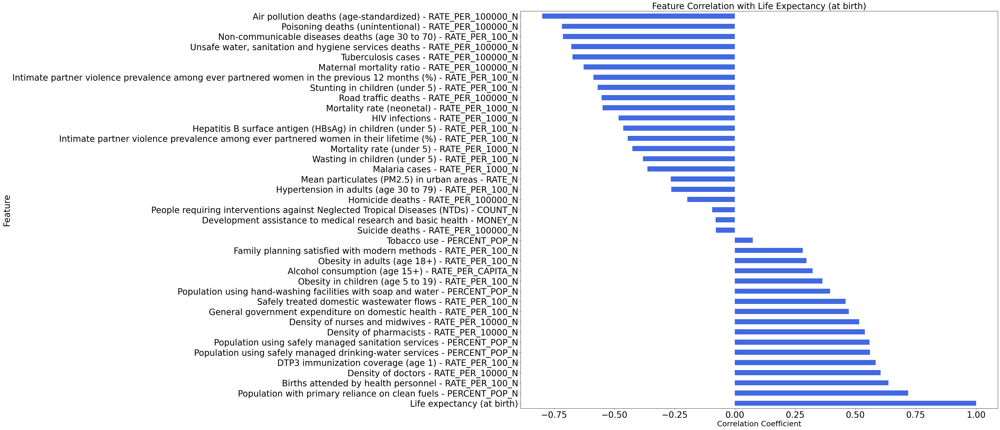

In [26]:
import matplotlib.pyplot as plt

# Extract correlations
life_expectancy_corr = correlation_matrix['Life expectancy (at birth)'].sort_values(ascending=False)

# Create figure and plot
plt.figure(figsize=(25, 21))  # Increase figure size
life_expectancy_corr.plot(kind='barh', color='royalblue')

# Customize font sizes
plt.xlabel('Correlation Coefficient', fontsize=22)  # X-axis label
plt.ylabel('Feature', fontsize=25)  # Y-axis label
plt.title('Feature Correlation with Life Expectancy (at birth)', fontsize=25)  # Title
plt.xticks(fontsize=25)  # X-axis tick labels
plt.yticks(fontsize=25)  # Y-axis tick labels

# Show plot
plt.show()

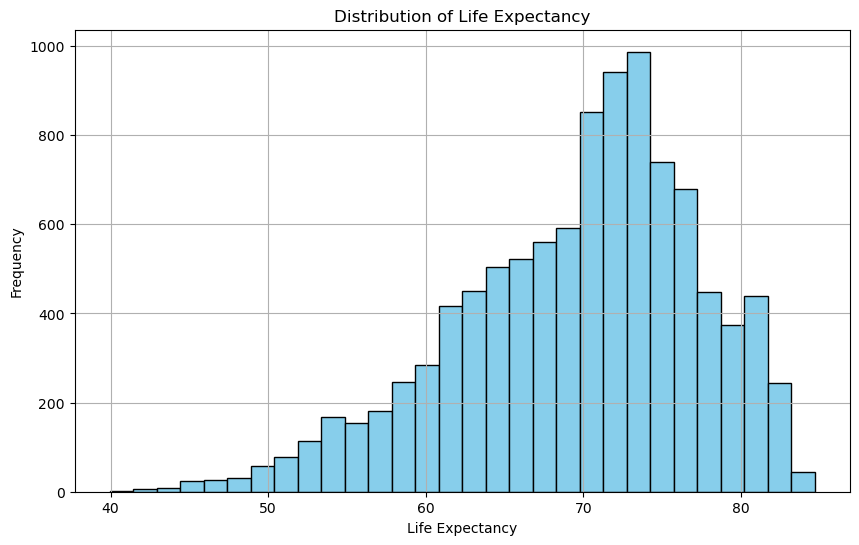

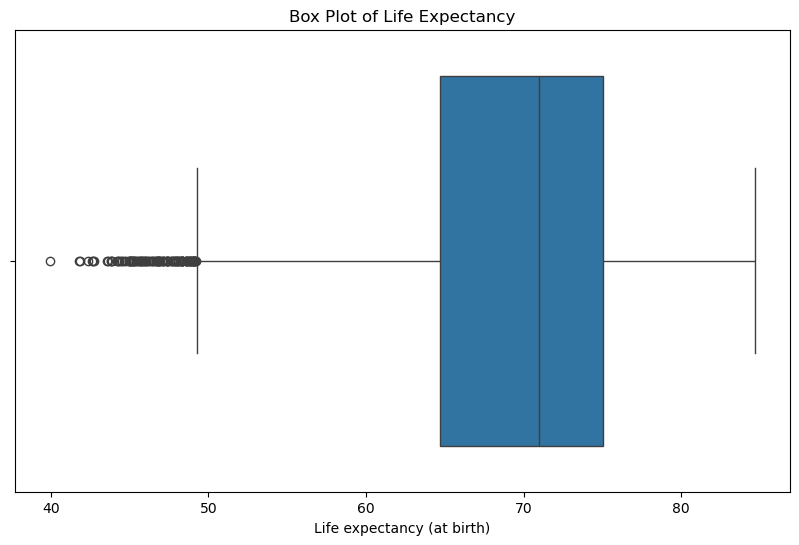

In [27]:
plt.figure(figsize=(10, 6))
df['Life expectancy (at birth)'].hist(bins=30, color='skyblue', edgecolor='black')  # Ensure column name matches
plt.title('Distribution of Life Expectancy')
plt.xlabel('Life Expectancy')
plt.ylabel('Frequency')
plt.show()

# Box plot for checking outliers in Life Expectancy
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['Life expectancy (at birth)'])  # Consistent column name
plt.title('Box Plot of Life Expectancy')
plt.show()

<Axes: xlabel='Life Expectancy Group', ylabel='General government expenditure on domestic health - RATE_PER_100_N'>

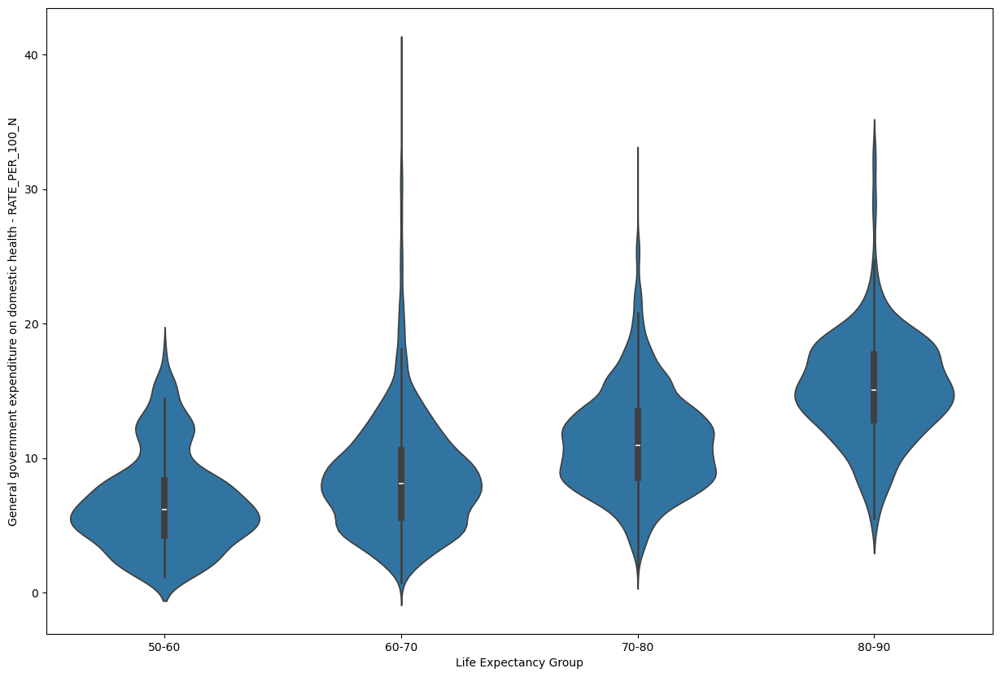

In [28]:
df['Life Expectancy Group'] = pd.cut(df['Life expectancy (at birth)'], bins=[50, 60, 70, 80, 90], labels=['50-60', '60-70', '70-80', '80-90'])
plt.figure(figsize=(15, 10))
sns.violinplot(x='Life Expectancy Group', y='General government expenditure on domestic health - RATE_PER_100_N', data=df)

<Figure size 1500x1000 with 0 Axes>

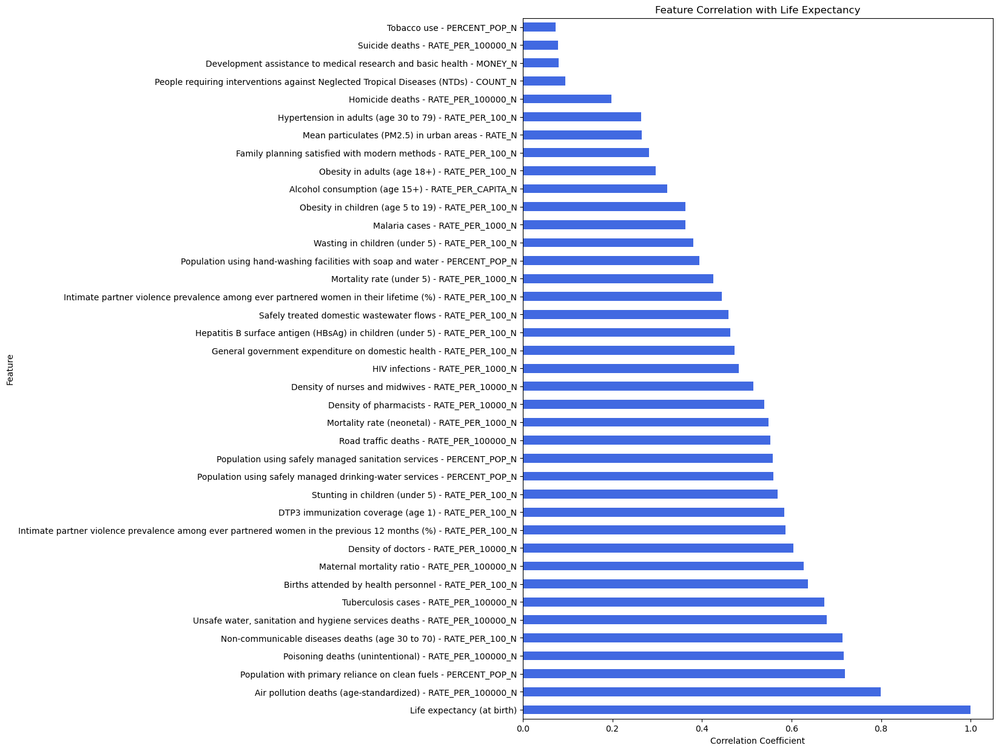

In [29]:
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as sch

plt.figure(figsize=(15, 10))

# Drop unwanted columns first
df_filtered = df.drop(columns=['DIM_GEO_CODE_M49', 'GEO_NAME_SHORT', 'DIM_TIME'])

# Keep only numeric columns
df_filtered_numeric = df_filtered.select_dtypes(include=['number'])  

# Compute correlation matrix
correlation_matrix = df_filtered_numeric.corr()

# Compute correlation with life expectancy from **filtered dataset**
corr_with_target = df_filtered_numeric.corr()['Life expectancy (at birth)'].abs().sort_values(ascending=False)

# Create bar chart
plt.figure(figsize=(10, 15))
corr_with_target.plot(kind='barh', color='royalblue')
plt.title('Feature Correlation with Life Expectancy')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Feature')
plt.show()

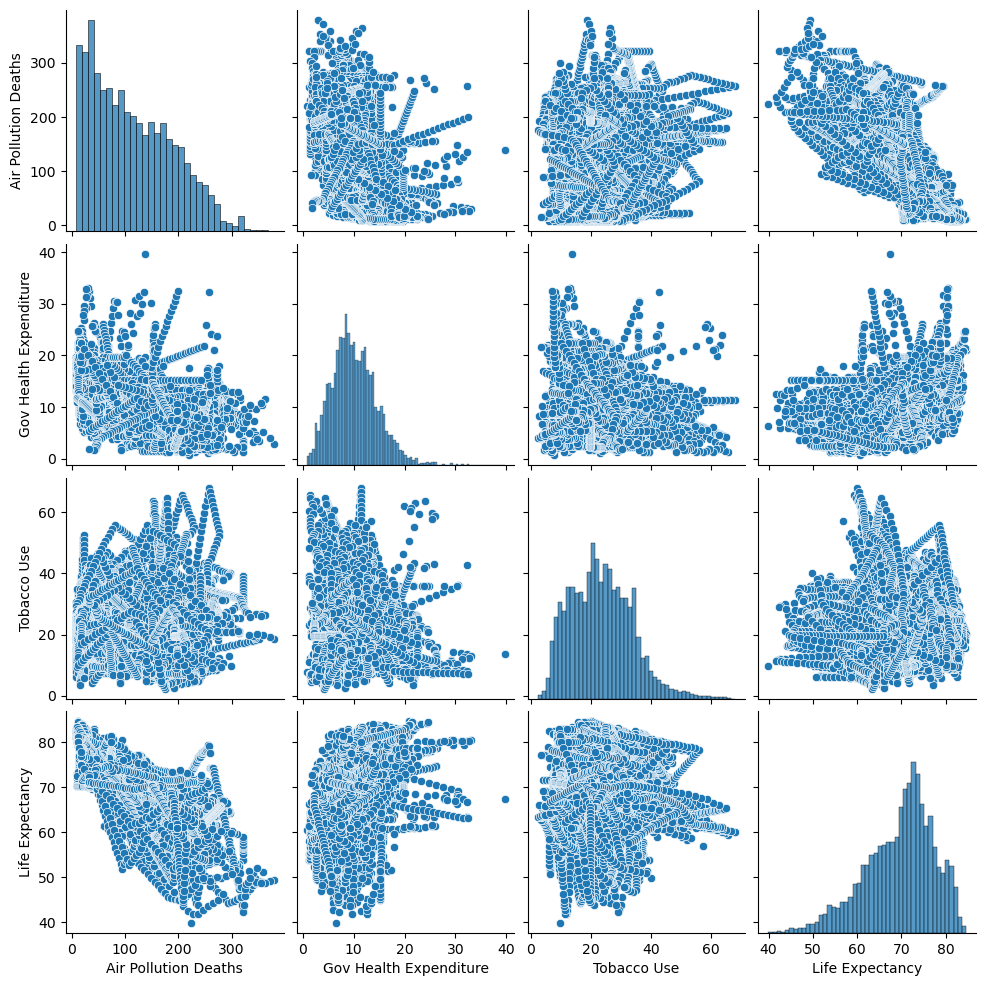

In [30]:
import seaborn as sns
import matplotlib.pyplot as plt

# Rename columns for better readability
selected_features = df.rename(columns={
    'Air pollution deaths (age-standardized) - RATE_PER_100000_N': 'Air Pollution Deaths',
    'General government expenditure on domestic health - RATE_PER_100_N': 'Gov Health Expenditure',
    'Tobacco use - PERCENT_POP_N': 'Tobacco Use',
    'Life expectancy (at birth)': 'Life Expectancy'
})

# Filter dataset to only include the required columns
selected_features = selected_features[['Air Pollution Deaths', 'Gov Health Expenditure', 'Tobacco Use', 'Life Expectancy']]

# Generate the pair plot
sns.pairplot(selected_features)
plt.show()

In [64]:
y = df['Life expectancy (at birth)']#target variable (Life Expectancy)
X = df.drop(columns=['Life expectancy (at birth)', 'Life Expectancy Group', 'GEO_NAME_SHORT', 'DIM_GEO_CODE_M49', 'DIM_TIME'])


In [75]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [77]:
from sklearn.preprocessing import StandardScaler

# Initialize the scaler
scaler = StandardScaler()

# Scale training and test data
X_train_scaled = scaler.fit_transform(X_train)  # Fit & transform training data
X_test_scaled = scaler.transform(X_test)  # Only transform test data (don't fit again)

# Now you can train the model
nn_model = MLPRegressor(hidden_layer_sizes=(50, 50), max_iter=1000, random_state=42)
nn_model.fit(X_train_scaled, y_train)

# Predict on the scaled test set
y_pred_nn = nn_model.predict(X_test_scaled)

In [79]:
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, explained_variance_score
from sklearn.model_selection import cross_val_score
import shap
from scipy.stats import kstest
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_acf

# Calculate RMSE
def calculate_rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

# Calculate Explained Variance
def calculate_explained_variance(y_true, y_pred):
    return explained_variance_score(y_true, y_pred)

# Calculate R-Squared (R²)
def calculate_r2(y_true, y_pred):
    return r2_score(y_true, y_pred)

# Calculate Mean Squared Error (MSE)
def calculate_mse(y_true, y_pred):
    return mean_squared_error(y_true, y_pred)

# Calculate Mean Absolute Error (MAE)
def calculate_mae(y_true, y_pred):
    return mean_absolute_error(y_true, y_pred)

# Calculate Mean Absolute Percentage Error (MAPE)
def calculate_mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Calculate Adjusted R-Squared
def calculate_adjusted_r2(r2, n, p):
    return 1 - (1 - r2) * (n - 1) / (n - p - 1)

# Plot Residual Distribution
def plot_residual_distribution(y_true, y_pred, model_name):
    residuals = y_true - y_pred
    plt.figure(figsize=(10, 6))
    sns.histplot(residuals, kde=True, color='blue')
    plt.title(f'Residual Distribution - {model_name}')
    plt.xlabel('Residuals')
    plt.ylabel('Frequency')
    plt.show()

# K-Fold Cross-Validation
def calculate_kfold_cv(model, X, y):
    cv_scores = cross_val_score(model, X, y, cv=5, scoring='neg_mean_squared_error')
    return np.mean(np.sqrt(-cv_scores))  # Convert negative MSE to RMSE

# Plot Residual Autocorrelation (ACF)
def plot_residual_autocorrelation(y_true, y_pred, model_name):
    residuals = y_true - y_pred
    plt.figure(figsize=(10, 6))
    plot_acf(residuals, lags=50)
    plt.title(f'Residual Autocorrelation - {model_name}')
    plt.show()

# Calculate Shapley Values (for tree-based models like Random Forest, Gradient Boosting, and XGBoost)
def calculate_shapley_values(model, X, model_name):
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X)
    shap.summary_plot(shap_values, X)
    plt.title(f'Shapley Values - {model_name}')
    plt.show()

# Kolmogorov-Smirnov Test for normality of residuals
def calculate_ks_test(y_true, y_pred, model_name):
    residuals = y_true - y_pred
    ks_statistic, p_value = kstest(residuals, 'norm')
    print(f"Kolmogorov-Smirnov Test for {model_name}: KS Statistic = {ks_statistic}, p-value = {p_value}")

Neural Network - RMSE: 0.7854990003137042
Neural Network - Explained Variance: 0.9899173534637264
Neural Network - R²: 0.9897976887370111
Neural Network - MSE: 0.6170086794938286
Neural Network - MAE: 0.5176482772352615
Neural Network - MAPE: 0.7710985020279653
Neural Network - Adjusted R²: 0.9896034563582569


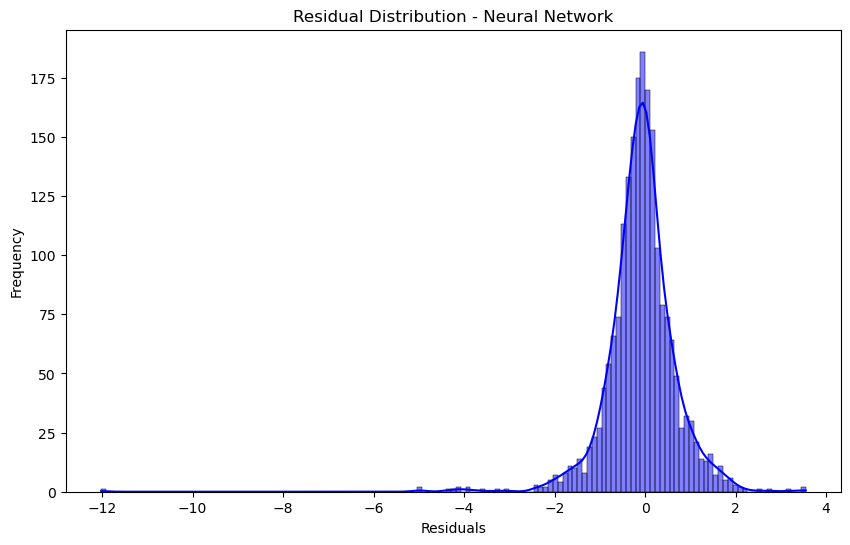

Neural Network - K-Fold RMSE: 483.7170932303796


<Figure size 1000x600 with 0 Axes>

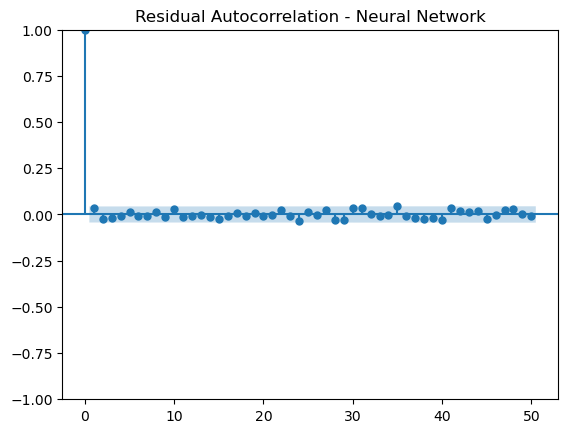

Kolmogorov-Smirnov Test for Neural Network: KS Statistic = 0.14822602166400856, p-value = 1.7173514237484613e-39


In [83]:
nn_model.fit(X_train_scaled, y_train)
y_pred_nn = nn_model.predict(X_test_scaled)

rmse_nn = calculate_rmse(y_test, y_pred_nn)
explained_variance_nn = calculate_explained_variance(y_test, y_pred_nn)
r2_nn = calculate_r2(y_test, y_pred_nn)
mse_nn = calculate_mse(y_test, y_pred_nn)
mae_nn = calculate_mae(y_test, y_pred_nn)
mape_nn = calculate_mape(y_test, y_pred_nn)
adjusted_r2_nn = calculate_adjusted_r2(r2_nn, len(y_test), X_test_scaled.shape[1])

# Print results
print(f"Neural Network - RMSE: {rmse_nn}")
print(f"Neural Network - Explained Variance: {explained_variance_nn}")
print(f"Neural Network - R²: {r2_nn}")
print(f"Neural Network - MSE: {mse_nn}")
print(f"Neural Network - MAE: {mae_nn}")
print(f"Neural Network - MAPE: {mape_nn}")
print(f"Neural Network - Adjusted R²: {adjusted_r2_nn}")

# Plot Residual Distribution
plot_residual_distribution(y_test, y_pred_nn, 'Neural Network')

# K-Fold Cross-Validation
cv_nn = calculate_kfold_cv(nn_model, X, y)
print(f"Neural Network - K-Fold RMSE: {cv_nn}")

# Residual Autocorrelation
plot_residual_autocorrelation(y_test, y_pred_nn, 'Neural Network')

# Kolmogorov-Smirnov Test
calculate_ks_test(y_test, y_pred_nn, 'Neural Network')

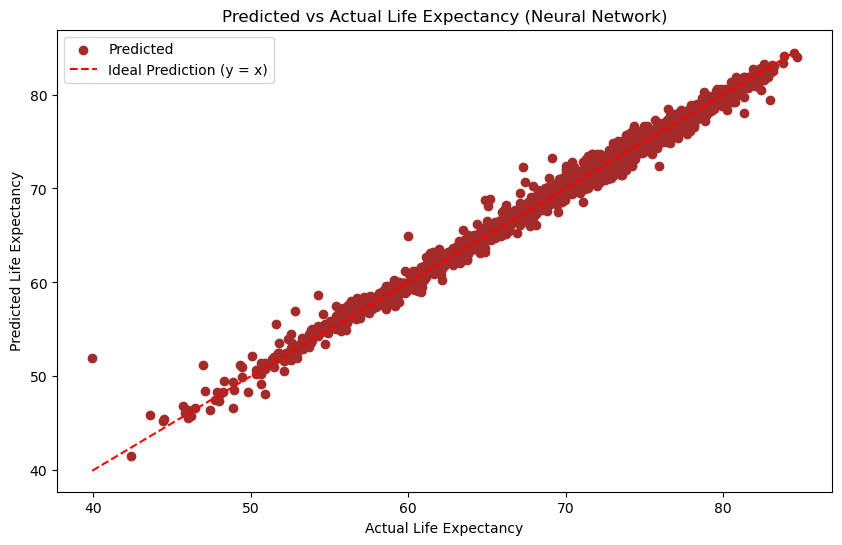

In [85]:
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_nn, color='brown', label='Predicted')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label="Ideal Prediction (y = x)")
plt.title('Predicted vs Actual Life Expectancy (Neural Network)')
plt.xlabel('Actual Life Expectancy')
plt.ylabel('Predicted Life Expectancy')
plt.legend()
plt.show()

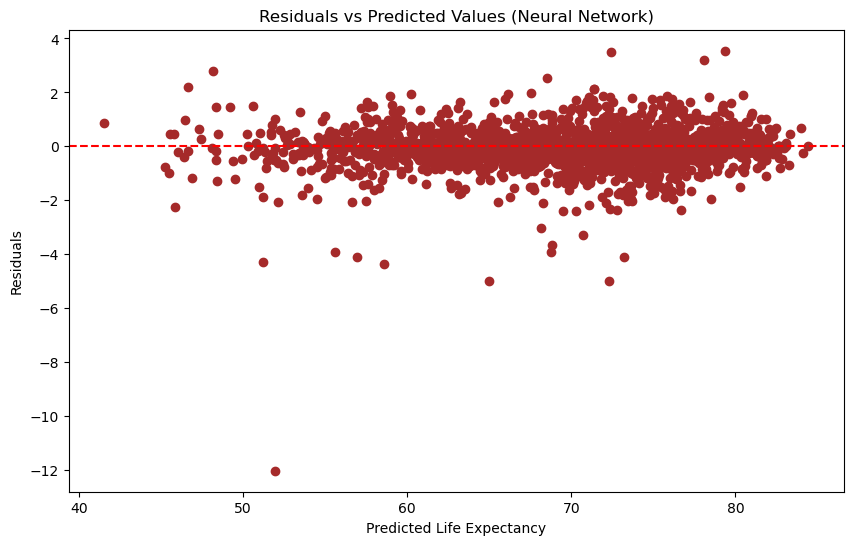

In [87]:
residuals_nn = y_test - y_pred_nn
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_nn, residuals_nn, color='brown')
plt.axhline(0, color='red', linestyle='--')  # Ideal line where residuals = 0
plt.title('Residuals vs Predicted Values (Neural Network)')
plt.xlabel('Predicted Life Expectancy')
plt.ylabel('Residuals')
plt.show()


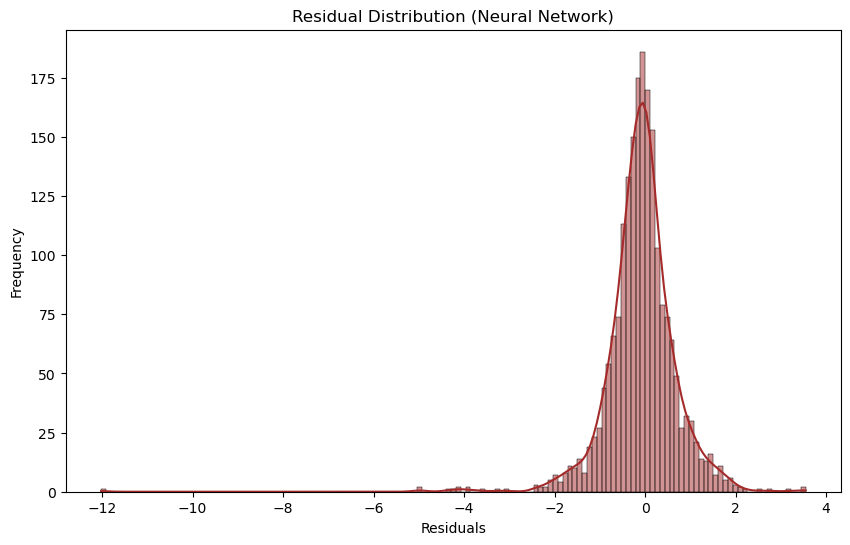

In [89]:
plt.figure(figsize=(10, 6))
sns.histplot(residuals_nn, kde=True, color='brown')
plt.title('Residual Distribution (Neural Network)')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()


In [91]:
import joblib
joblib.dump(scaler, 'scaler.pkl')

['scaler.pkl']

In [93]:
joblib.dump(nn_model, 'neural_network_model.pkl')

['neural_network_model.pkl']